In [367]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns


In [368]:
#Read df
df = pd.read_csv("Cleaned_Data_Merchant_Name.csv")


In [369]:
df.rename(columns={'Trx_Rank': 'Count_of_merchant_visits', 'Mer_Name': 'Merchant', 'Trx_Vlu': 'Money_spent', 'Trx_Age': 'Transaction_Age' , 'Customer_Age':'Last_Transaction' , '':''}, inplace=True)

Explore DataFrame

In [370]:
df.head()

,Count_of_merchant_visits,Points,Money_spent,Transaction_Age,Last_Transaction,Category In English,User_Id,Merchant
0,1,20140,2014.0,362,362,Fashion,21053,Shankar Traders
1,1,11200,1120.0,371,368,Fashion,26472,Shankar Traders
2,2,8500,850.0,368,368,Fashion,26472,Shankar Traders
3,1,1980,198.0,558,34,Fashion,27075,Shankar Traders
4,1,2400,240.0,413,413,Fashion,27417,Shankar Traders


In [371]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43672 entries, 0 to 43671
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Count_of_merchant_visits  43672 non-null  int64  
 1   Points                    43672 non-null  int64  
 2   Money_spent               43672 non-null  float64
 3   Transaction_Age           43672 non-null  int64  
 4   Last_Transaction          43672 non-null  int64  
 5   Category In English       43672 non-null  object 
 6   User_Id                   43672 non-null  int64  
 7   Merchant                  43672 non-null  object 
dtypes: float64(1), int64(5), object(2)
memory usage: 2.7+ MB


In [372]:
df.describe()

,Count_of_merchant_visits,Points,Money_spent,Transaction_Age,Last_Transaction,User_Id
count,43672.000000,43672.000000,43672.000000,43672.000000,43672.000000,43672.000000
mean,1.265227,3312.249748,331.224975,185.186664,144.027844,17173.411889
std,0.776549,5756.374137,575.637414,121.989540,114.764448,9665.399084
min,1.000000,20.000000,2.000000,1.000000,1.000000,0.000000
25%,1.000000,1220.000000,122.000000,62.000000,34.000000,8710.750000
50%,1.000000,1893.500000,189.350000,203.000000,115.000000,17561.000000
75%,1.000000,3100.000000,310.000000,271.000000,252.000000,25634.250000
max,17.000000,263800.000000,26380.000000,698.000000,682.000000,33518.000000


In [373]:
# check data duplication
df.duplicated().sum()

0

univariate analysis

count of merchant visits

In [374]:
df["Count_of_merchant_visits"].value_counts()

1     36348
2      5079
3      1301
4       497
5       200
6       101
7        57
8        33
9        21
10       13
11       10
12        6
13        2
14        1
15        1
16        1
17        1
Name: Count_of_merchant_visits, dtype: int64

In [375]:
df["Count_of_merchant_visits"].nunique()

17

In [376]:
#drop values that ferrequent less than 10
indices_to_drop = []
for i in range(12, 18):
    
    indices = df[df["Count_of_merchant_visits"] == i].index
    indices_to_drop.extend(indices)

df.drop(indices_to_drop, inplace=True)

df.reset_index(drop=True, inplace=True)

In [377]:
df["Count_of_merchant_visits"].value_counts()


1     36348
2      5079
3      1301
4       497
5       200
6       101
7        57
8        33
9        21
10       13
11       10
Name: Count_of_merchant_visits, dtype: int64

Category In English

In [378]:
df["Category In English"].unique()

array(['Fashion', 'F&B', 'Other', 'Grocery', 'Transportaion',
       'Electronics', 'Health & Beauty'], dtype=object)

In [379]:
df["Category In English"].value_counts()


Grocery            30688
F&B                 7720
Fashion             3333
Health & Beauty     1504
Electronics          222
Transportaion        146
Other                 47
Name: Category In English, dtype: int64

Last Transaction

In [380]:
df["Last_Transaction"].nunique()

527

In [381]:
px.box(df["Last_Transaction"])

In [382]:
#drop vlaues 628 and 644 because they are outliers
df.drop(df[df["Last_Transaction"] == 682].index, inplace=True)
df.drop(df[df["Last_Transaction"] == 644].index, inplace=True)

Points

In [383]:
df["Points"].nunique()

5907

In [384]:
px.box(df["Points"])

Money spent

In [385]:
df["Money_spent"].nunique()

5907

In [386]:
px.box(df["Money_spent"])

In [387]:
df["Money_spent"].sort_values(ascending=True)[:100]

43659    2.0
9438     2.0
9278     2.0
30033    2.0
30035    2.0
        ... 
27989    7.0
36221    7.0
13697    7.0
2724     7.3
3034     7.8
Name: Money_spent, Length: 100, dtype: float64

In [388]:
df.drop(df[df["Money_spent"] ==2].index, inplace=True)
df.reset_index(drop=True)

,Count_of_merchant_visits,Points,Money_spent,Transaction_Age,Last_Transaction,Category In English,User_Id,Merchant
0,1,20140,2014.0,362,362,Fashion,21053,Shankar Traders
1,1,11200,1120.0,371,368,Fashion,26472,Shankar Traders
2,2,8500,850.0,368,368,Fashion,26472,Shankar Traders
3,1,1980,198.0,558,34,Fashion,27075,Shankar Traders
4,1,2400,240.0,413,413,Fashion,27417,Shankar Traders
...,...,...,...,...,...,...,...,...
43586,1,5500,550.0,12,5,F&B,20563,Cuttack Curtain Corner
43587,2,6500,650.0,5,5,F&B,20563,Cuttack Curtain Corner
43588,1,3050,305.0,27,27,F&B,26865,Cuttack Curtain Corner
43589,1,3120,312.0,31,31,F&B,27128,Cuttack Curtain Corner


Transaction Age

In [389]:
df["Transaction_Age"].nunique()

572

In [390]:
px.box(df["Transaction_Age"])

Merchant

In [391]:
df["Merchant"].unique()

array(['Shankar Traders', 'Radha Emporium', 'Ganpati Enterprises',
       'Saraswati Fabrics', 'Krishna Textiles', 'Gupta Saree Center',
       'Mohan Brothers Mart', 'Jai Hind General Stores',
       'Rajasthan Handicrafts', 'Varanasi Silk House',
       'Delhi Electronics', 'Punjabi Furniture Palace',
       'Mumbai Fashion Hub', 'Chennai Gems and Jewels',
       'Kolkata Carpets Corner', 'Hyderabad Spices Bazaar',
       'Jaipur Pottery Emporium', 'Lucknow Leather World',
       'Ahmedabad Sweet Mart', 'Bangalore Book House',
       'Kochi Kitchenware Kingdom', 'Pune Perfumes Paradise',
       'Goa Grocery Galaxy', 'Patna Paints Palace', 'Nagpur Novelty Nook',
       'Indore Instrument Inn', 'Surat Stationery Studio',
       'Thane Tea Traders', 'Agra Appliance Arena',
       'Vadodara Vegetables Villa', 'Amritsar Auto Accessories',
       'Shimla Shoe Shoppe', 'Ranchi Rug Retail',
       'Guwahati Grocery Galleria', 'Nashik Noodle Niche',
       'Kanpur Kitchen Appliances', 'Thiruv

In [392]:
df["Merchant"].nunique()


52

In [393]:
df["Merchant"].value_counts().sort_values(ascending=True)


Surat Stationery Studio             1
Noida Novelty Nook                  1
Chennai Gems and Jewels             1
Bangalore Book House                1
Shimla Shoe Shoppe                  1
Gupta Saree Center                  2
Mysuru Mobile Mart                  2
Dehradun Dairy Delight              2
Patna Paints Palace                 2
Kolkata Carpets Corner              3
Vijayawada Vegetable Village        3
Guwahati Grocery Galleria           3
Thiruvananthapuram Toy Town         3
Kollam Kitchenware Kingdom          4
Udaipur Utensil Universe            4
Shankar Traders                     5
Mohan Brothers Mart                 5
Goa Grocery Galaxy                  6
Kochi Kitchenware Kingdom           7
Hyderabad Spices Bazaar             8
Radha Emporium                     10
Kanpur Kitchen Appliances          10
Lucknow Leather World              11
Ahmedabad Sweet Mart               12
Ganpati Enterprises                15
Jaipur Pottery Emporium            19
Trichy Tailo

In [394]:
# if count of occurrences of each name in a DataFrame is less than 5 i will drop it
name_counts = df["Merchant"].value_counts()

# Get the names where the count is less than 5
names_to_drop = name_counts[name_counts < 5].index

# Drop rows with names that have a count less than 5
df = df[~df["Merchant"].isin(names_to_drop)]

df.reset_index(drop=True, inplace=True)

In [395]:
df["Merchant"].value_counts().sort_values(ascending=True)

Shankar Traders                     5
Mohan Brothers Mart                 5
Goa Grocery Galaxy                  6
Kochi Kitchenware Kingdom           7
Hyderabad Spices Bazaar             8
Kanpur Kitchen Appliances          10
Radha Emporium                     10
Lucknow Leather World              11
Ahmedabad Sweet Mart               12
Ganpati Enterprises                15
Jaipur Pottery Emporium            19
Trichy Tailoring Trends            20
Nagpur Novelty Nook                25
Vadodara Vegetables Villa          31
Punjabi Furniture Palace           33
Delhi Electronics                  36
Thane Tea Traders                  36
Cuttack Curtain Corner             38
Jamshedpur Jeans Junction          38
Bhubaneswar Baker's Boutique       45
Nashik Noodle Niche                88
Jodhpur Jewelry Junction          101
Gwalior Garden Gear               133
Ranchi Rug Retail                 133
Krishna Textiles                  145
Varanasi Silk House               157
Faridabad Fo

In [396]:
df

,Count_of_merchant_visits,Points,Money_spent,Transaction_Age,Last_Transaction,Category In English,User_Id,Merchant
0,1,20140,2014.0,362,362,Fashion,21053,Shankar Traders
1,1,11200,1120.0,371,368,Fashion,26472,Shankar Traders
2,2,8500,850.0,368,368,Fashion,26472,Shankar Traders
3,1,1980,198.0,558,34,Fashion,27075,Shankar Traders
4,1,2400,240.0,413,413,Fashion,27417,Shankar Traders
...,...,...,...,...,...,...,...,...
43553,1,5500,550.0,12,5,F&B,20563,Cuttack Curtain Corner
43554,2,6500,650.0,5,5,F&B,20563,Cuttack Curtain Corner
43555,1,3050,305.0,27,27,F&B,26865,Cuttack Curtain Corner
43556,1,3120,312.0,31,31,F&B,27128,Cuttack Curtain Corner


EDA

In [397]:
df_numeric = df.select_dtypes(include='number')

fig = px.imshow(
    df_numeric.corr(),
    labels=dict(x="Columns", y="Columns", color="Correlation"),
    x=df_numeric.columns,
    y=df_numeric.columns,
    color_continuous_scale="Viridis",
    color_continuous_midpoint=0,
    range_color=[-1, 1],
    height=600,
    width=800,
    title="Correlation Matrix"
)

# Show the plot
fig.show()

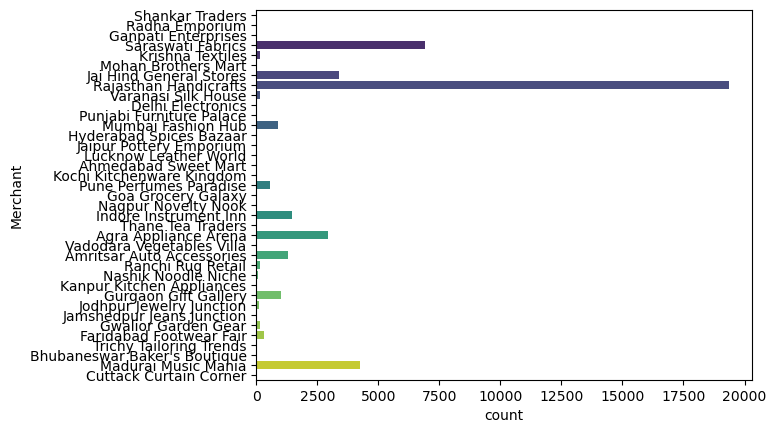

In [398]:
sns.countplot(y="Merchant", data=df, palette="viridis")
plt.show()

In [399]:

fig = px.histogram(df, x="Money_spent", color="Merchant", nbins=30, histfunc="count", template="plotly", width=800, height=400,title="mony spent based on Marchent")
fig.show()


In [400]:

fig = px.pie(df, values='Money_spent', names='Category In English',width=800,title="category name based on percentage of money spent")
fig.show()

In [401]:

fig = px.violin(df, y="Money_spent", box=True, points="all", width=1000, height=500, title="Money spent distribution")
fig.show()


In [402]:
px.scatter(df, "Money_spent" , "Last_Transaction",width=1000, height=500, title="Money spent vs. last transaction")


handle Outliers

In [403]:
# Define a function to filter outliers based on IQR
def remove_outliers(data_column):
    Q1 = data_column.quantile(0.25)
    Q3 = data_column.quantile(0.75)
    IQR = Q3 - Q1
    return data_column[(data_column >= Q1 - 1.5 * IQR) & (data_column <= Q3 + 1.5 * IQR)]


In [404]:
#i will drop the outliers from Transaction Age becuse Their number is small
df["Transaction_Age"] = remove_outliers(df["Transaction_Age"])


In [405]:
#plot Transaction_Age
px.box(df["Transaction_Age"])


In [406]:
#understand the outliers in Money spent colunm 
def identify_outliers(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = (column < lower_bound) | (column > upper_bound)
    return outliers

# Identify outliers and create a new DataFrame
outliers_df = df[identify_outliers(df['Money_spent'])]

In [407]:
outliers_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4627 entries, 0 to 43554
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Count_of_merchant_visits  4627 non-null   int64  
 1   Points                    4627 non-null   int64  
 2   Money_spent               4627 non-null   float64
 3   Transaction_Age           4626 non-null   float64
 4   Last_Transaction          4627 non-null   int64  
 5   Category In English       4627 non-null   object 
 6   User_Id                   4627 non-null   int64  
 7   Merchant                  4627 non-null   object 
dtypes: float64(2), int64(4), object(2)
memory usage: 325.3+ KB


In [408]:
outliers_df.head(20)

,Count_of_merchant_visits,Points,Money_spent,Transaction_Age,Last_Transaction,Category In English,User_Id,Merchant
0,1,20140,2014.0,362.0,362,Fashion,21053,Shankar Traders
1,1,11200,1120.0,371.0,368,Fashion,26472,Shankar Traders
2,2,8500,850.0,368.0,368,Fashion,26472,Shankar Traders
5,1,16740,1674.0,34.0,34,F&B,1447,Radha Emporium
10,1,9491,949.1,47.0,47,F&B,10975,Radha Emporium
12,1,7580,758.0,5.0,5,F&B,14823,Radha Emporium
13,1,5952,595.2,55.0,55,F&B,16503,Radha Emporium
20,1,7200,720.0,328.0,321,Other,21265,Ganpati Enterprises
21,2,10800,1080.0,321.0,321,Other,21265,Ganpati Enterprises
23,1,9400,940.0,29.0,29,Other,26257,Ganpati Enterprises


In [409]:
outliers_df["Category In English"].value_counts()

Grocery            3053
F&B                 761
Fashion             608
Health & Beauty      91
Electronics          85
Transportaion        17
Other                12
Name: Category In English, dtype: int64

In [410]:
outliers_df["Merchant"].value_counts()

Rajasthan Handicrafts           2005
Agra Appliance Arena             527
Madurai Music Mania              524
Saraswati Fabrics                521
Jai Hind General Stores          241
Mumbai Fashion Hub               211
Gurgaon Gift Gallery              91
Indore Instrument Inn             83
Faridabad Footwear Fair           72
Gwalior Garden Gear               58
Pune Perfumes Paradise            48
Varanasi Silk House               44
Jodhpur Jewelry Junction          43
Amritsar Auto Accessories         35
Jamshedpur Jeans Junction         21
Thane Tea Traders                 20
Krishna Textiles                  17
Nashik Noodle Niche                8
Nagpur Novelty Nook                7
Ahmedabad Sweet Mart               6
Delhi Electronics                  6
Punjabi Furniture Palace           5
Lucknow Leather World              5
Radha Emporium                     4
Ganpati Enterprises                4
Bhubaneswar Baker's Boutique       3
Shankar Traders                    3
V

In [411]:
outliers_df[outliers_df["Merchant"]=="Rajasthan Handicrafts"].mean()


C:\Users\dell\AppData\Local\Temp\ipykernel_17504\3981532809.py:1: FutureWarning:

The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.



Count_of_merchant_visits        1.341147
Points                      15099.113716
Money_spent                  1509.911372
Transaction_Age               151.642394
Last_Transaction              111.808978
User_Id                     15386.962594
dtype: float64

In [412]:
outliers_df.describe()

,Count_of_merchant_visits,Points,Money_spent,Transaction_Age,Last_Transaction,User_Id
count,4627.000000,4627.000000,4627.000000,4626.000000,4627.000000,4627.000000
mean,1.342122,14406.707370,1440.670737,203.200173,149.555868,17210.895613
std,0.963831,12462.301148,1246.230115,125.307342,122.248021,9395.575096
min,1.000000,5922.000000,592.200000,1.000000,1.000000,8.000000
25%,1.000000,7580.000000,758.000000,72.000000,34.000000,8590.000000
50%,1.000000,10700.000000,1070.000000,242.000000,110.000000,18605.000000
75%,1.000000,19960.000000,1996.000000,306.000000,265.500000,26262.000000
max,11.000000,263800.000000,26380.000000,579.000000,541.000000,33502.000000


In [413]:
#after investegate i will drop any value Greater than 1996 in Money spent
df.drop(df[df["Money_spent"] > 1996].index, axis=0,inplace=True)
df.reset_index(drop=True)


,Count_of_merchant_visits,Points,Money_spent,Transaction_Age,Last_Transaction,Category In English,User_Id,Merchant
0,1,11200,1120.0,371.0,368,Fashion,26472,Shankar Traders
1,2,8500,850.0,368.0,368,Fashion,26472,Shankar Traders
2,1,1980,198.0,558.0,34,Fashion,27075,Shankar Traders
3,1,2400,240.0,413.0,413,Fashion,27417,Shankar Traders
4,1,16740,1674.0,34.0,34,F&B,1447,Radha Emporium
...,...,...,...,...,...,...,...,...
42399,1,5500,550.0,12.0,5,F&B,20563,Cuttack Curtain Corner
42400,2,6500,650.0,5.0,5,F&B,20563,Cuttack Curtain Corner
42401,1,3050,305.0,27.0,27,F&B,26865,Cuttack Curtain Corner
42402,1,3120,312.0,31.0,31,F&B,27128,Cuttack Curtain Corner


RFM Clustering

Recency

In [414]:
df_recency=df[['User_Id', 'Last_Transaction']].drop_duplicates().reset_index(drop=True)
                   

In [415]:
df_recency

,User_Id,Last_Transaction
0,26472,368
1,27075,34
2,27417,413
3,1447,34
4,2709,33
...,...,...
32620,16310,1
32621,19177,27
32622,20060,20
32623,27128,31


Frequency

In [416]:
# Calculate Frequency by counting the number of unique User_Id values
frequency_df = df['User_Id'].value_counts().reset_index()
frequency_df.columns = ['User_Id', 'Frequency']

# Display the Frequency DataFrame
frequency_df

,User_Id,Frequency
0,1238,17
1,6573,17
2,13442,16
3,3632,16
4,14189,15
...,...,...
32620,7244,1
32621,7240,1
32622,7239,1
32623,7237,1


Monetary Value

In [417]:
# Your original code to calculate monetary_value_df
monetary_value_df = df.groupby('User_Id')['Money_spent'].sum().reset_index()
monetary_value_df.columns = ['User_Id', 'Monetary']

# Merge the original DataFrame with the calculated monetary_value_df
df_merged = pd.merge(df, monetary_value_df, on='User_Id', how='left')



In [418]:
df_merged

,Count_of_merchant_visits,Points,Money_spent,Transaction_Age,Last_Transaction,Category In English,User_Id,Merchant,Monetary
0,1,11200,1120.0,371.0,368,Fashion,26472,Shankar Traders,1970.0
1,2,8500,850.0,368.0,368,Fashion,26472,Shankar Traders,1970.0
2,1,1980,198.0,558.0,34,Fashion,27075,Shankar Traders,900.0
3,1,2400,240.0,413.0,413,Fashion,27417,Shankar Traders,240.0
4,1,16740,1674.0,34.0,34,F&B,1447,Radha Emporium,1674.0
...,...,...,...,...,...,...,...,...,...
42399,1,5500,550.0,12.0,5,F&B,20563,Cuttack Curtain Corner,2214.0
42400,2,6500,650.0,5.0,5,F&B,20563,Cuttack Curtain Corner,2214.0
42401,1,3050,305.0,27.0,27,F&B,26865,Cuttack Curtain Corner,733.0
42402,1,3120,312.0,31.0,31,F&B,27128,Cuttack Curtain Corner,312.0


In [419]:
monetary_value_df= df_merged[["User_Id", "Monetary"]]

monetary_value_df.drop_duplicates(inplace=True)

C:\Users\dell\AppData\Local\Temp\ipykernel_17504\228877470.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [420]:
# Calculate Frequency by counting the number of unique User_Id values
frequency_df = df['User_Id'].value_counts().reset_index()
frequency_df.columns = ['User_Id', 'Frequency']

# Display the Frequency DataFrame
frequency_df

,User_Id,Frequency
0,1238,17
1,6573,17
2,13442,16
3,3632,16
4,14189,15
...,...,...
32620,7244,1
32621,7240,1
32622,7239,1
32623,7237,1


In [421]:
# Group by 'User_Id' and aggregate 'Merchant'
ferr_merchant = df.groupby('User_Id')['Merchant'].agg(lambda x: ', '.join(pd.Series(x).drop_duplicates())).reset_index()
# Merge the deduplicated data back into the original DataFrame
ferr_merchent = pd.merge(df[['User_Id']], ferr_merchant, on='User_Id', how='left')

ferr_merchent.head()

,User_Id,Merchant
0,26472,Shankar Traders
1,26472,Shankar Traders
2,27075,"Shankar Traders, Agra Appliance Arena"
3,27417,Shankar Traders
4,1447,Radha Emporium


In [422]:
ferr_merchent.drop_duplicates(inplace=True)

In [423]:
 #Group by 'User_Id' and aggregate 'Category In English' 
ferr_category = df.groupby('User_Id')['Category In English'].agg(lambda x: ', '.join(pd.Series(x).drop_duplicates())).reset_index()

# Merge the deduplicated data back into the original DataFrame
ferr_category = pd.merge(df[['User_Id']], ferr_category, on='User_Id', how='left')

ferr_category.head()

,User_Id,Category In English
0,26472,Fashion
1,26472,Fashion
2,27075,Fashion
3,27417,Fashion
4,1447,F&B


In [424]:
#drop duplicates 
ferr_category.drop_duplicates(inplace=True)

merge the RMF columns into one df

In [425]:
ferr_df = pd.merge(ferr_category, ferr_merchent, on='User_Id', how='left')


In [426]:
df010 = pd.merge(df_recency, monetary_value_df, on='User_Id', how='left')
df020 = pd.merge(df010, frequency_df, on='User_Id', how='left')
rfm = pd.merge(df020, ferr_df, on='User_Id', how='left')


In [427]:
rfm.rename(columns={'Last_Transaction': 'Recency'}, inplace=True)

In [428]:
# Add segment bin values to RFM table using quartile.
rfm['r_quartile'] = pd.qcut(rfm['Recency'], 4, ['4', '3', '2', '1']).astype(int)
rfm['m_quartile'] = pd.qcut(rfm['Monetary'], 4, ['1', '2', '3', '4']).astype(int)
rfm['f_quartile'] = pd.cut(rfm['Frequency'], bins=4, labels=['1', '2', '3', '4'], duplicates='drop').astype(int)

rfm

,User_Id,Recency,Monetary,Frequency,Category In English,Merchant,r_quartile,m_quartile,f_quartile
0,26472,368,1970.0,2,Fashion,Shankar Traders,1,4,1
1,27075,34,900.0,3,Fashion,"Shankar Traders, Agra Appliance Arena",4,4,1
2,27417,413,240.0,1,Fashion,Shankar Traders,1,3,1
3,1447,34,1674.0,1,F&B,Radha Emporium,4,4,1
4,2709,33,582.0,1,F&B,Radha Emporium,4,4,1
...,...,...,...,...,...,...,...,...,...
32620,16310,1,200.0,1,F&B,Cuttack Curtain Corner,4,2,1
32621,19177,27,163.0,1,F&B,Cuttack Curtain Corner,4,2,1
32622,20060,20,113.0,1,F&B,Cuttack Curtain Corner,4,1,1
32623,27128,31,312.0,1,F&B,Cuttack Curtain Corner,4,3,1


In [429]:
# Combine quartiles to create RFM score
rfm['RFM_Segment_Concat'] = rfm['r_quartile'].astype(str) + rfm['m_quartile'].astype(str) + rfm['f_quartile'].astype(str)


In [430]:
rfm['RFM_Score'] = rfm[['r_quartile','f_quartile','m_quartile']].sum(axis=1)

In [431]:
rfm

,User_Id,Recency,Monetary,Frequency,Category In English,Merchant,r_quartile,m_quartile,f_quartile,RFM_Segment_Concat,RFM_Score
0,26472,368,1970.0,2,Fashion,Shankar Traders,1,4,1,141,6
1,27075,34,900.0,3,Fashion,"Shankar Traders, Agra Appliance Arena",4,4,1,441,9
2,27417,413,240.0,1,Fashion,Shankar Traders,1,3,1,131,5
3,1447,34,1674.0,1,F&B,Radha Emporium,4,4,1,441,9
4,2709,33,582.0,1,F&B,Radha Emporium,4,4,1,441,9
...,...,...,...,...,...,...,...,...,...,...,...
32620,16310,1,200.0,1,F&B,Cuttack Curtain Corner,4,2,1,421,7
32621,19177,27,163.0,1,F&B,Cuttack Curtain Corner,4,2,1,421,7
32622,20060,20,113.0,1,F&B,Cuttack Curtain Corner,4,1,1,411,6
32623,27128,31,312.0,1,F&B,Cuttack Curtain Corner,4,3,1,431,8


In [432]:
# Define rfm_level function
def rfm_level(df):
    if df['RFM_Score'] >= 9:
        return "Can't Loose Them"
    elif (8 <= df['RFM_Score'] < 9):
        return 'Champions'
    elif (7 <= df['RFM_Score'] < 8):
        return 'Loyal'
    elif (6 <= df['RFM_Score'] < 7):
        return 'Potential'
    elif (5 <= df['RFM_Score'] < 6):
        return 'Promising'
    elif (4 <= df['RFM_Score'] < 5):
        return 'Needs Attention'
    else:
        return 'Require Activation'
    
# Apply the rfm_level function to create a new 'RFM_Level' column
rfm['RFM_Level'] = rfm.apply(rfm_level, axis=1)


In [433]:
rfm

,User_Id,Recency,Monetary,Frequency,Category In English,Merchant,r_quartile,m_quartile,f_quartile,RFM_Segment_Concat,RFM_Score,RFM_Level
0,26472,368,1970.0,2,Fashion,Shankar Traders,1,4,1,141,6,Potential
1,27075,34,900.0,3,Fashion,"Shankar Traders, Agra Appliance Arena",4,4,1,441,9,Can't Loose Them
2,27417,413,240.0,1,Fashion,Shankar Traders,1,3,1,131,5,Promising
3,1447,34,1674.0,1,F&B,Radha Emporium,4,4,1,441,9,Can't Loose Them
4,2709,33,582.0,1,F&B,Radha Emporium,4,4,1,441,9,Can't Loose Them
...,...,...,...,...,...,...,...,...,...,...,...,...
32620,16310,1,200.0,1,F&B,Cuttack Curtain Corner,4,2,1,421,7,Loyal
32621,19177,27,163.0,1,F&B,Cuttack Curtain Corner,4,2,1,421,7,Loyal
32622,20060,20,113.0,1,F&B,Cuttack Curtain Corner,4,1,1,411,6,Potential
32623,27128,31,312.0,1,F&B,Cuttack Curtain Corner,4,3,1,431,8,Champions


Data preprocessing



In [434]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OrdinalEncoder 
import category_encoders as ce


In [435]:
rfm.head()

,User_Id,Recency,Monetary,Frequency,Category In English,Merchant,r_quartile,m_quartile,f_quartile,RFM_Segment_Concat,RFM_Score,RFM_Level
0,26472,368,1970.0,2,Fashion,Shankar Traders,1,4,1,141,6,Potential
1,27075,34,900.0,3,Fashion,"Shankar Traders, Agra Appliance Arena",4,4,1,441,9,Can't Loose Them
2,27417,413,240.0,1,Fashion,Shankar Traders,1,3,1,131,5,Promising
3,1447,34,1674.0,1,F&B,Radha Emporium,4,4,1,441,9,Can't Loose Them
4,2709,33,582.0,1,F&B,Radha Emporium,4,4,1,441,9,Can't Loose Them


In [436]:
#i will apply *binary encoder* on Category In English and Merchant columns
#ordinal encoding for *RFM_Level*
binary = ce.BinaryEncoder()
ordinal = OrdinalEncoder()
column_to_scale = rfm.columns
processor = ColumnTransformer(
    transformers=[
        ("binary_encoder", binary , ["Category In English", "Merchant"]),
        ("ordinal_encoder", ordinal, ["RFM_Level"]),
                ],
    remainder='passthrough'
)


DIMENSIONALITY REDUCTION



In [437]:
#encoding rfm
encoder= ce.BinaryEncoder(cols=["Category In English", "Merchant"])
encodeing_rfm = encoder.fit_transform(rfm)
ordinal = OrdinalEncoder()
encodeing_rfm = ordinal.fit_transform(encodeing_rfm)



In [438]:
#scale rfm
stander_scaler = StandardScaler()
scaled_rfm = stander_scaler.fit_transform(encodeing_rfm)


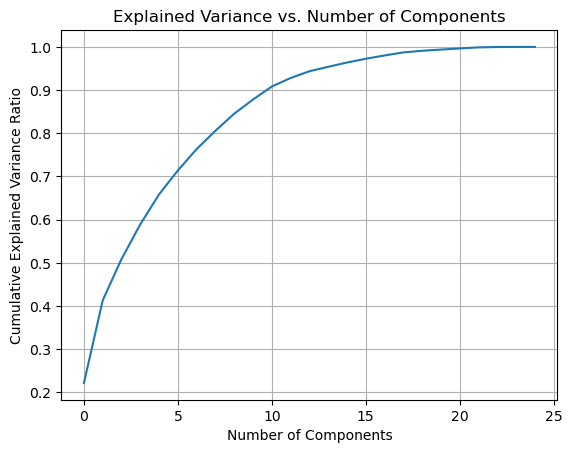

In [439]:
from sklearn.decomposition import PCA

# Fit PCA and get explained variance ratios
pca = PCA()
pca.fit(scaled_rfm)
explained_variances = pca.explained_variance_ratio_

# Plot cumulative explained variance ratio
cumulative_variance = np.cumsum(explained_variances)
plt.plot(cumulative_variance)
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance Ratio")
plt.title("Explained Variance vs. Number of Components")
plt.grid()
plt.show()

In [440]:
#i think no need to apply pca on this data

import unsupervised algorithm

In [441]:
from imblearn.pipeline import Pipeline
from sklearn.cluster import KMeans, DBSCAN , AgglomerativeClustering , MeanShift
from sklearn.mixture import GaussianMixture
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.model_selection import cross_val_predict, cross_val_score
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import silhouette_score
from sklearn.model_selection import StratifiedKFold
from sklearn.base import clone


KMeans

In [442]:

my_pipeline = Pipeline([
    ("transform", processor),
    ("scaling", StandardScaler()),
    ("cluster", KMeans(n_clusters=9, n_init=10)),
])

# Make a copy of the dataframe
Kmeans_rfm = rfm.copy()

# Use cross_val_predict to get predicted labels for visualization
predicted_labels = cross_val_predict(my_pipeline, Kmeans_rfm, cv=5)

# Add predicted labels to the original DataFrame
Kmeans_rfm['predicted_labels_kmeans'] = predicted_labels

# Create an interactive 3D scatter plot with Plotly Express
fig = px.scatter_3d(Kmeans_rfm, x='Recency', y='Monetary', z='Frequency', color='predicted_labels_kmeans',
                    symbol='predicted_labels_kmeans', opacity=0.7,
                    title='3D Scatter Plot of Predicted Clusters',
                    labels={'Recency': 'X', 'Monetary': 'Y', 'Frequency': 'Z'})

# Show the plot
fig.show()


In [443]:
Kmeans_rfm["predicted_labels_kmeans"].value_counts()

1    13748
3     5012
5     2674
8     2566
7     2463
2     2257
6     2103
0      939
4      863
Name: predicted_labels_kmeans, dtype: int64

DBSCAN

In [444]:

my_pipeline = Pipeline([
    ("transform", processor),
    ("scaling", StandardScaler()),
    ("cluster", DBSCAN(eps=3.25, min_samples=250, n_jobs=-1)),  
])

# Use fit_predict instead of cross_val_predict for DBSCAN
predicted_labels = my_pipeline.fit_predict(rfm)

# Make a copy of the dataframe
DBSCAN_rfm = rfm.copy()

# Add predicted labels to the original DataFrame
DBSCAN_rfm['predicted_labels_DBSCAN'] = predicted_labels

# Create an interactive 3D scatter plot with Plotly Express
fig = px.scatter_3d(DBSCAN_rfm, x='Recency', y='Monetary', z='Frequency', color='predicted_labels_DBSCAN',
                    symbol='predicted_labels_DBSCAN', opacity=0.7,
                    title='3D Scatter Plot of Predicted Clusters',
                    labels={'Recency': 'X', 'Monetary': 'Y', 'Frequency': 'Z'})

# Show the plot
fig.show()

In [445]:
dict_map ={
    
    -1 : 9 ,  0 : 1 ,  1 : 2,  2 : 3 ,  3 : 4, 4 : 5, 5 : 6 , 6 : 7 , 7 : 8 ,
    
}

DBSCAN_rfm["predicted_labels_DBSCAN"] = DBSCAN_rfm["predicted_labels_DBSCAN"].map(dict_map)


In [446]:
DBSCAN_rfm["predicted_labels_DBSCAN"].value_counts()

1    19590
9     3376
8     2512
2     2130
5     2017
6     1038
4      888
7      647
3      427
Name: predicted_labels_DBSCAN, dtype: int64

best merchant in each cluster

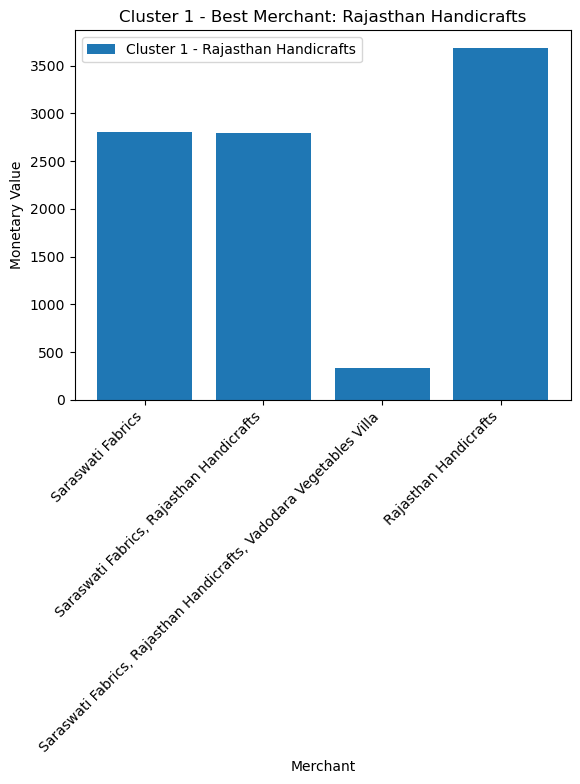

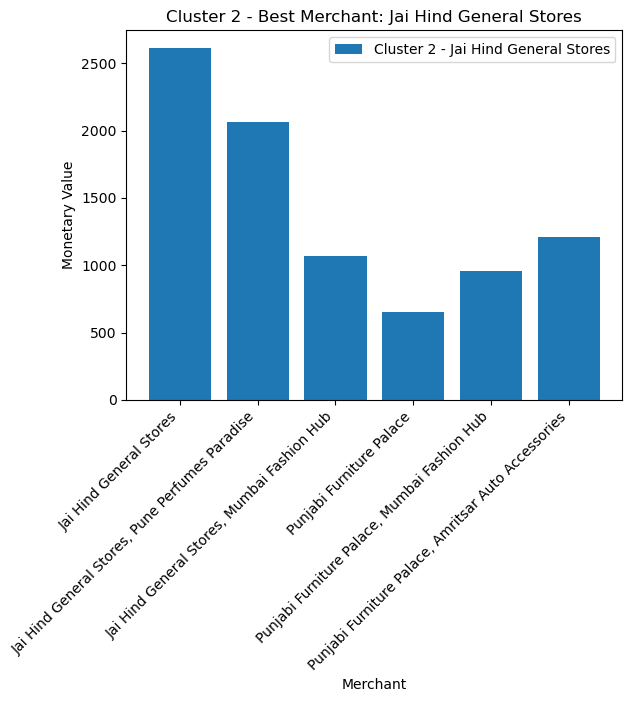

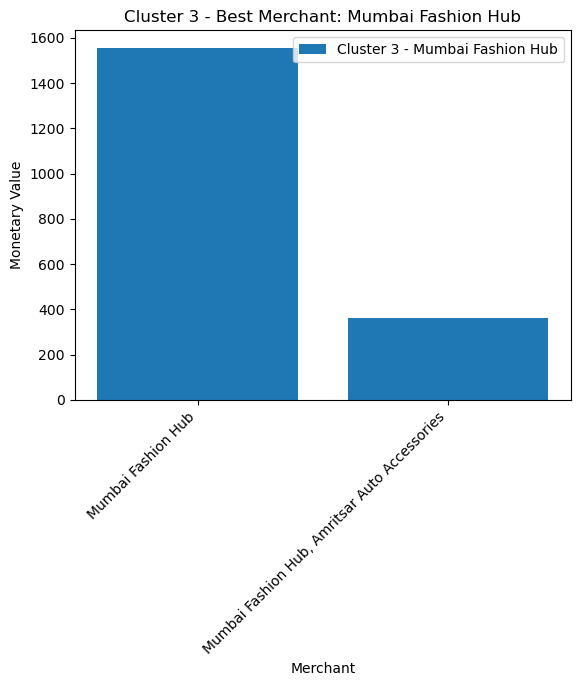

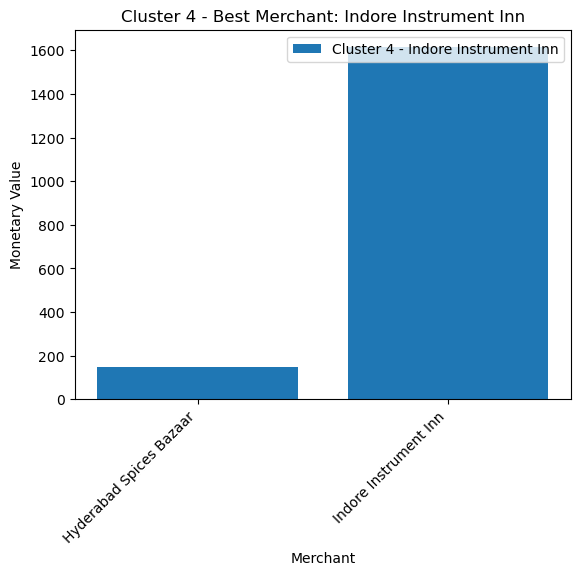

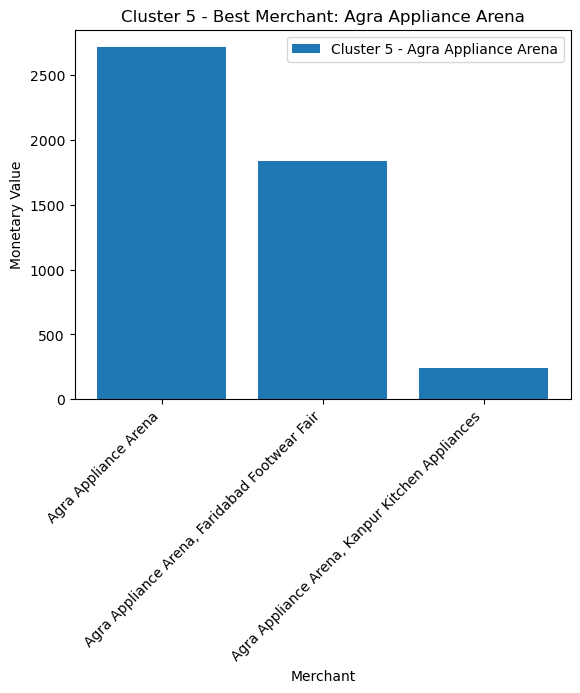

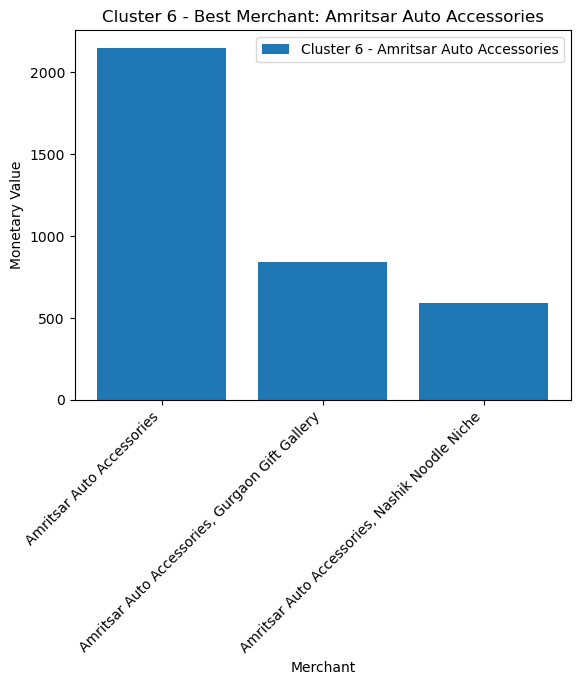

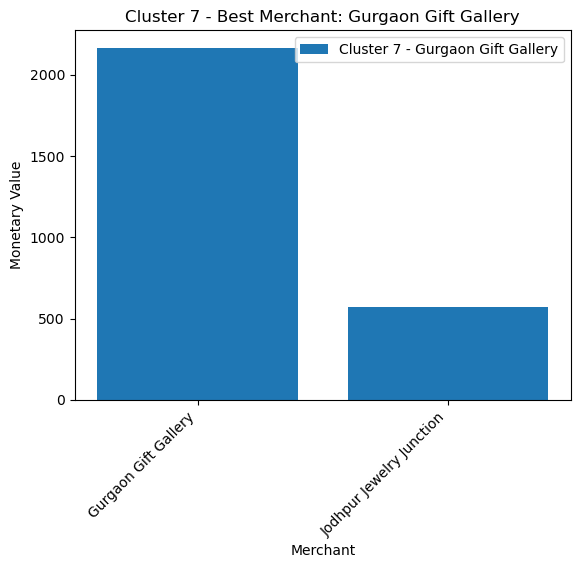

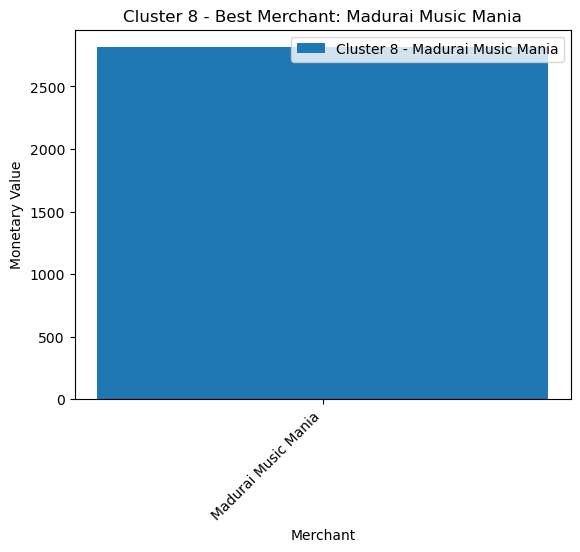

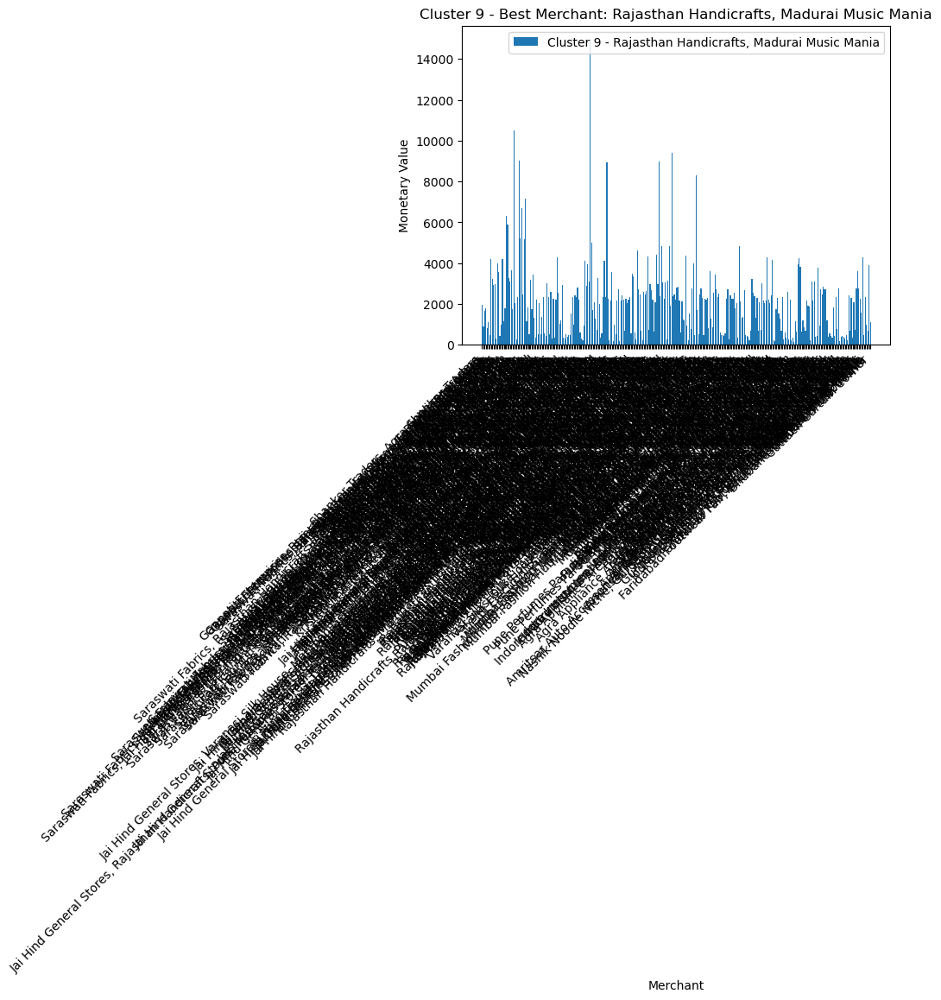

In [447]:
#best merchant in each cluster
# Group by the cluster labels
cluster_groups = DBSCAN_rfm.groupby('predicted_labels_DBSCAN')

# Dictionary to store the best merchant for each cluster
best_merchants = {}

# Iterate through each cluster
for cluster_label, cluster_data in cluster_groups:
    # Calculate aggregated metrics for each merchant in the cluster
    merchant_metrics = cluster_data.groupby('Merchant').agg({
        'Monetary': 'sum',  # You can use other metrics like 'count' or 'mean'
    })
    
    # Find the merchant with the highest aggregated metric
    best_merchant = merchant_metrics.idxmax()['Monetary']
    
    # Store the result in the dictionary
    best_merchants[cluster_label] = best_merchant

# Create a separate figure for each cluster
for cluster_label, best_merchant in best_merchants.items():
    # Filter data for the current cluster
    cluster_data = DBSCAN_rfm[DBSCAN_rfm['predicted_labels_DBSCAN'] == cluster_label]

    # Create a bar plot for the current cluster
    fig, ax = plt.subplots()
    ax.bar(cluster_data['Merchant'], cluster_data['Monetary'], label=f'Cluster {cluster_label} - {best_merchant}')

    # Add labels and title
    ax.set_xlabel('Merchant')
    ax.set_ylabel('Monetary Value')
    ax.set_title(f'Cluster {cluster_label} - Best Merchant: {best_merchant}')

    # Rotate x-axis labels for better visibility
    plt.xticks(rotation=45, ha='right')

    # Add legend
    ax.legend()

    # Show the plot for the current cluster
    plt.show()


In [448]:
df = pd.merge(left=DBSCAN_rfm[["User_Id" , "predicted_labels_DBSCAN"]] , right=df , on = "User_Id" )

In [449]:
df

,User_Id,predicted_labels_DBSCAN,Count_of_merchant_visits,Points,Money_spent,Transaction_Age,Last_Transaction,Category In English,Merchant
0,26472,9,1,11200,1120.0,371.0,368,Fashion,Shankar Traders
1,26472,9,2,8500,850.0,368.0,368,Fashion,Shankar Traders
2,27075,9,1,1980,198.0,558.0,34,Fashion,Shankar Traders
3,27075,9,1,2860,286.0,327.0,34,Fashion,Agra Appliance Arena
4,27075,9,2,4160,416.0,34.0,34,Fashion,Agra Appliance Arena
...,...,...,...,...,...,...,...,...,...
42399,16310,9,1,2000,200.0,1.0,1,F&B,Cuttack Curtain Corner
42400,19177,9,1,1630,163.0,27.0,27,F&B,Cuttack Curtain Corner
42401,20060,9,1,1130,113.0,20.0,20,F&B,Cuttack Curtain Corner
42402,27128,9,1,3120,312.0,31.0,31,F&B,Cuttack Curtain Corner


In [450]:
maping = {
    j:i for i,j in enumerate(df["Merchant"].unique())
}
df["Merchant"]=df["Merchant"].map(maping)

In [451]:
df.rename(columns={'Trx_Rank': 'Count_of_merchant_visits', 'Mer_Name': 'Merchant', 'Trx_Vlu': 'Money_spent', 'Trx_Age': 'Transaction_Age' , 'Customer_Age':'Last_Transaction' , '':''}, inplace=True)

In [455]:
def Get_Recommendation(User , dataframe , num_of_recommendation) :
    Cluster = dataframe[dataframe["User_Id"] == User]["predicted_labels_DBSCAN"].unique()[0]
    df_cluster = dataframe[dataframe["predicted_labels_DBSCAN"] == Cluster]
    df_cluster = df_cluster.groupby("Merchant")["Money_spent"].sum().nlargest(num_of_recommendation)
    for index , mer in enumerate(df_cluster.index):
        print(f"Recommendation number {index+1} of user {User} is {mer}")
        
    return df_cluster

In [456]:
Get_Recommendation(1,df , 3).index


Recommendation number 1 of user 1 is 1
Recommendation number 2 of user 1 is 16
Recommendation number 3 of user 1 is 18


Int64Index([1, 16, 18], dtype='int64', name='Merchant')

In [458]:
df.to_csv('ClusterdData.csv', index=False)
DBSCAN_rfm.to_csv('RmfData.csv', index=False)


In [459]:
df

,User_Id,predicted_labels_DBSCAN,Count_of_merchant_visits,Points,Money_spent,Transaction_Age,Last_Transaction,Category In English,Merchant
0,26472,9,1,11200,1120.0,371.0,368,Fashion,0
1,26472,9,2,8500,850.0,368.0,368,Fashion,0
2,27075,9,1,1980,198.0,558.0,34,Fashion,0
3,27075,9,1,2860,286.0,327.0,34,Fashion,1
4,27075,9,2,4160,416.0,34.0,34,Fashion,1
...,...,...,...,...,...,...,...,...,...
42399,16310,9,1,2000,200.0,1.0,1,F&B,10
42400,19177,9,1,1630,163.0,27.0,27,F&B,10
42401,20060,9,1,1130,113.0,20.0,20,F&B,10
42402,27128,9,1,3120,312.0,31.0,31,F&B,10
